In [1]:
from spatialmath import UnitQuaternion
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML
import spatialmath.base as smb


Calculo de rotaciones con cuaterniones

Tal y como se vio en clase, se tiene que normalizar el vector primero, esto se consigue diviendo el vector que definirá el eje de rotacion `V` por lo que es su norma que en este caso se calcula con la funcion `np.linalg.norm(V)`

In [ ]:
V = np.array([1,1,0])
Vn = V / np.linalg.norm(V)

Acorde a la teoria vista, lo que deberiamos de hacer en caso de no tener esta funcion seria desarrollar la programacion para el calculo de cuaterniones, tal cual se vio en clase 

Empleando las siguientes ecuaciones:

$w$:

$w = \cos\left(\frac{\theta}{2}\right)$

Calculan las casillas $x, y, z$:

$x = u_x \cdot \sin\left(\frac{\theta}{2}\right)$

$y = u_y \cdot \sin\left(\frac{\theta}{2}\right)$

$z = u_z \cdot \sin\left(\frac{\theta}{2}\right)$

Pero todo esto se reduce a simplemente ingresar la funcion:

**`UnitQuaternion.AngVec(np.radians(90),Vn)`**

A la cual *`np.radians()`* le indica el angulo de rotacion convertido en radianes y *`Vn`* es el vector normalizado

In [ ]:
q = UnitQuaternion.AngVec(np.radians(90),Vn)

print('Cuaternion:',q)

Cuaternion:  0.7071 <<  0.5000,  0.5000,  0.0000 >>


Aqui obtenemos el dato de rotacion del cuaternion (nos arroja el valor de la matriz de rotacion que indica su orientacion)

In [4]:
q.R

array([[ 0.5       ,  0.5       ,  0.70710678],
       [ 0.5       ,  0.5       , -0.70710678],
       [-0.70710678,  0.70710678,  0.        ]])

Tal y como se comento en clase, los *ejes fijos* indican una rotacion (correspondiente a la convecion **ZYX** de Euler)

Por el contrarioTal los *ejes moviles* indican una rotacion (correspondiente a la convecion **XYZ** de Euler) 

In [6]:
print('Angulos del cuaternion de rotacion:',q.rpy(order='zyx',unit='deg'))
print('Angulos del cuaternion de rotacion, respecto al mundo:',q.rpy(order='xyz',unit='deg'))

Angulos del cuaternion de rotacion: [90. 45. 45.]
Angulos del cuaternion de rotacion, respecto al mundo: [-45.  45.  90.]


Comprobamos la composicion de la matriz de rotacion del cuaternion empleando la **convencion ZYX de Angulos de Euler**

In [7]:
import spatialmath as sp

M = sp.SO3.Rz(45, unit='deg') * sp.SO3.Ry(45, unit='deg') * sp.SO3.Rx(90,unit='deg')

Nos retorna la propiedad de Array de la matriz obtenida con spatial math

In [9]:
M.A

array([[ 5.00000000e-01,  5.00000000e-01,  7.07106781e-01],
       [ 5.00000000e-01,  5.00000000e-01, -7.07106781e-01],
       [-7.07106781e-01,  7.07106781e-01,  4.32978028e-17]])

Nos permite comprobar la igualdad de la matriz compuesta del cuaternion y la rotacion equivalente obtenida por ZYX de Euler

In [10]:
np.allclose(q.R,M.A)

True

Con esto, graficamos tanto el eje fijo (definido por la matriz identidad, correspondiente a **`R0`**)

Asi mismo tambien se grafica el eje rotado Qr, del cual solicitamos solo la propiedad de rotacion con **`q.R`**

<Axes3D: xlabel='X', ylabel='Y', zlabel='Z'>

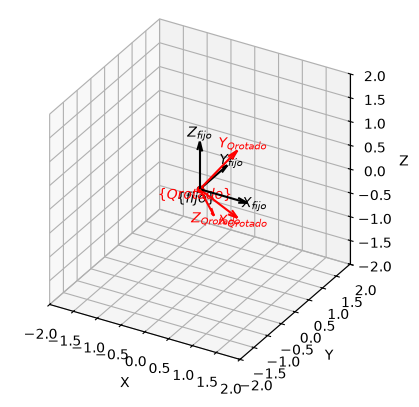

In [14]:
R0 = sp.SO3()

smb.trplot(R0.R,frame='fijo',color='black')
smb.trplot(q.R,frame='Qrotado',color='red',dims=[-2,2])

Se genera la animacion con `tranimate`

In [15]:
anim = smb.tranimate(q.R,frame='Qr',color='red',arrow=True,
                     nframes=60,fps=30,dims=[-2,2])

plt.close()

HTML(anim.to_jshtml())



Con la funcion `sp.SO3.AngVec()`, calculamos el par de torsion o rotacion

Sin esta funcion de la libreria, habria que desarrollar el codigo para obtenerla mediante la ecuacion previamente vista, del libro de robotica, que nos pide la suma de productos matriciales, dicha ecuacion esta definida de la siguiente manera:

$$R_{\mathbf{k},\theta} = I \cos(\theta) + \mathbf{k}\mathbf{k}^T [1 - \cos(\theta)] + S(\mathbf{k}) \sin(\theta)$$

Donde:

$\theta$  es el angulo de rotacion

$I$ la matriz identidad

$\mathbf{k}$ es el vector que se empleara para definir el rotacion

$\mathbf{k}^T$ es el transpuesto del vector empleado para definir el eje de rotacion

$S(\mathbf{k})$ es la matriz antisimetrica de k:

$\begin{bmatrix} 0 & -k_z & k_y \\ k_z & 0 & -k_x \\ -k_y & k_x & 0 \end{bmatrix} s_\theta$

Los argumentos dentro de la funcion `sp.SO3.AngVec()`

Son un vector normalizado `Vr` y el angulo de rotacion, en este caso en radianes


In [16]:
Vr = np.array([0,1,1])
Vrn = Vr / np.linalg.norm(Vr)

P = sp.SO3.AngVec(np.radians(90),Vr)

print(P)

   0        -0.7071    0.7071    
   0.7071    0.5       0.5       
  -0.7071    0.5       0.5       



Extramos la propiedad de rotacion (matriz de rotacion) con `P.R` y la graficamos con trplot

<Axes3D: xlabel='X', ylabel='Y', zlabel='Z'>

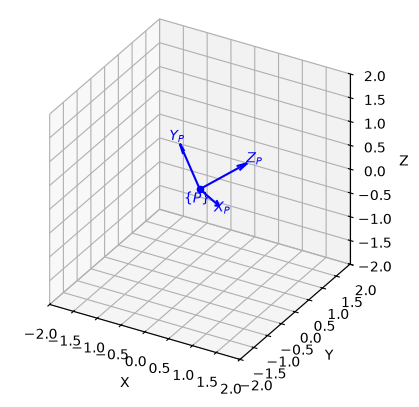

In [18]:
smb.trplot(P.R,frame='P',color='blue',dims=[-2,2])

Se genera la animacion de la rotacion dada por el par de rotacion con `tranimate`

In [19]:
anim = smb.tranimate(P.R,frame='Pr',color='red',arrow=True,
                     nframes=60,fps=30,dims=[-2,2])

plt.close()

HTML(anim.to_jshtml())